# <span style='background :yellow' > **Exercise 3.2** </span>

In [31]:
## The estimation of the fraction with dimension N=2

import random

num = 10000

circle_points = 0

for i in range(num):
    rand_x = random.uniform(-1, 1) # Randomly generated x and y values from a uniform distribution
    rand_y = random.uniform(-1, 1)
    origin_dist = rand_x**2 + rand_y**2 # Distance between (x, y) from the origin

    # Checking if (x, y) lies inside the circle
    if origin_dist <= 1:
         circle_points += 1
            
frac =  circle_points / num # Compute the fraction
    
frac 


0.7834

In [19]:
## The fraction of my expectation

import numpy as np
my_frac = np.pi/4
my_frac

0.7853981633974483

### <span style='color:Purple'> Conclusion: The estimation of the fraction is 0.782. My expectation is 0.785. So the estimation is almost consistent with my expectation.  </span>

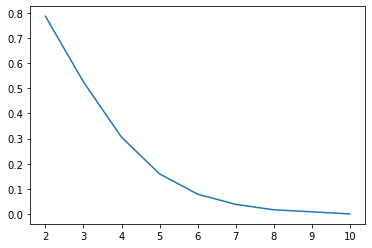

In [48]:
## Dimension from 2 to 10

import matplotlib.pyplot as plt

circle_points2 = 0
circle_points3 = 0
circle_points4 = 0
circle_points5 = 0
circle_points6 = 0
circle_points7 = 0
circle_points8 = 0
circle_points9 = 0
circle_points10 = 0

Radius_2 = []
Radius_3 = []
Radius_4 = []
Radius_5 = []
Radius_6 = []
Radius_7 = []
Radius_8 = []
Radius_9 = []
Radius_10 = []


for i in range(num):
    X=np.random.uniform(-1,1,10)
    X2=X**2
    origin_dist2 = np.sqrt(np.sum(X2[:2]))
    origin_dist3 = np.sqrt(np.sum(X2[:3]))
    origin_dist4 = np.sqrt(np.sum(X2[:4]))
    origin_dist5 = np.sqrt(np.sum(X2[:5]))
    origin_dist6 = np.sqrt(np.sum(X2[:6]))
    origin_dist7 = np.sqrt(np.sum(X2[:7]))
    origin_dist8 = np.sqrt(np.sum(X2[:8]))
    origin_dist9 = np.sqrt(np.sum(X2[:9]))
    origin_dist10 = np.sqrt(np.sum(X2[:10]))
    
    Radius_2.append(origin_dist2)
    Radius_3.append(origin_dist3)
    Radius_4.append(origin_dist4)
    Radius_5.append(origin_dist5)
    Radius_6.append(origin_dist6)
    Radius_7.append(origin_dist7)
    Radius_8.append(origin_dist8)
    Radius_9.append(origin_dist9)
    Radius_10.append(origin_dist10)
    
    
    

    if origin_dist2 <= 1:
         circle_points2 += 1
            
    if origin_dist3 <= 1:
         circle_points3 += 1
            
    if origin_dist4 <= 1:
         circle_points4 += 1
            
    if origin_dist5 <= 1:
         circle_points5 += 1
            
   
    if origin_dist6 <= 1:
         circle_points6 += 1
            
    if origin_dist7 <= 1:
         circle_points7 += 1
            
    if origin_dist8 <= 1:
         circle_points8 += 1
            
    if origin_dist9 <= 1:
         circle_points9 += 1
            
    if origin_dist10 <= 1:
         circle_points9 += 1
            
           
frac2 =  circle_points2 / num # Compute the fraction
frac3 =  circle_points3 / num 
frac4 =  circle_points4 / num 
frac5 =  circle_points5 / num 
frac6 =  circle_points6 / num 
frac7 =  circle_points7 / num 
frac8 =  circle_points8 / num 
frac9 =  circle_points9 / num 
frac10 =  circle_points10 / num 

plt.plot(np.arange(2,11),(frac2,frac3,frac4,frac5,frac6,frac7,frac8,frac9,frac10))

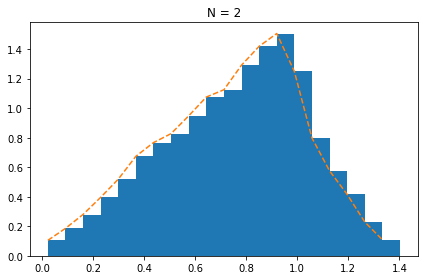

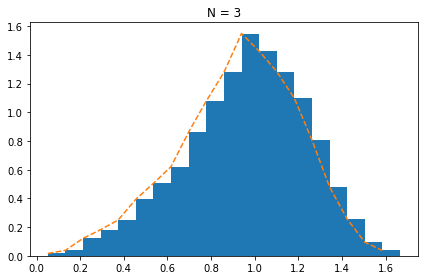

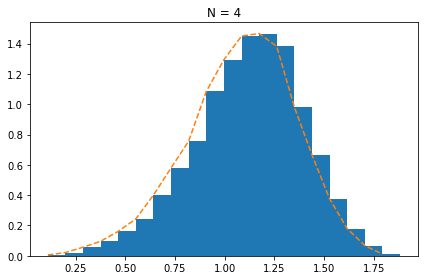

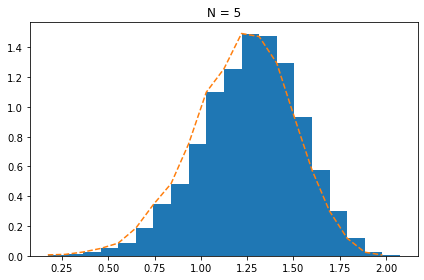

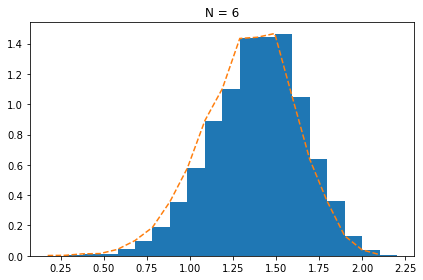

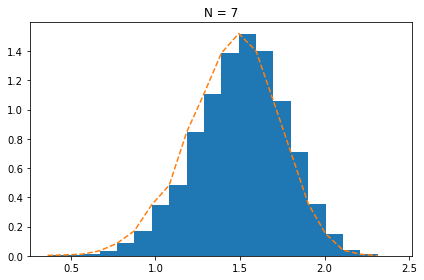

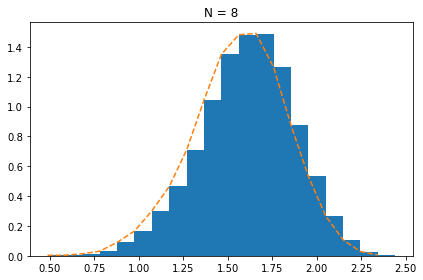

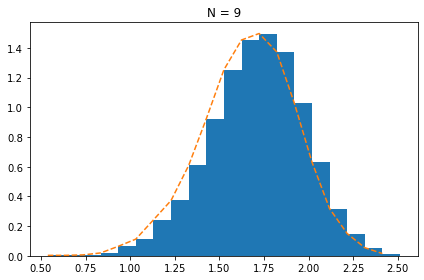

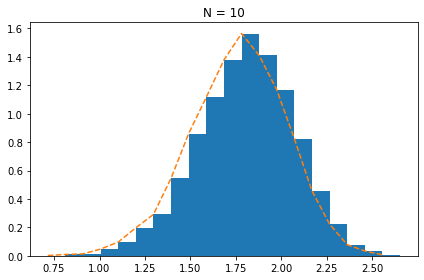

In [66]:
# Compute the histogram of the radii of the randomly sampled points for each N and plot these.

Radius = [Radius_2, Radius_3, Radius_4, Radius_5, Radius_6, Radius_7, Radius_8, Radius_9, Radius_10]

k=1
for R in Radius:
    fig, ax = plt.subplots()
    n, bins_limits, patches = ax.hist(R, bins=20, density=1)
    ax.plot(bins_limits[:20],n,'--')
    k += 1
    plt.title('N = ' + str(k))
    plt.tight_layout()
    plt.show()



### <span style='color:Purple'> Conclusion: As the dimension N increases, the radius of more points tends to 2.  </span>

# <span style='background :yellow' > **Exercise 3.3** </span>

In [1]:
import numpy as np

def cosamp(phi, u, s, epsilon=1e-10, max_iter=30):
    """
    Return an `s`-sparse approximation of the target signal
    Input:
        - phi, sampling matrix
        - u, noisy sample vector
        - s, sparsity
    """
    a = np.zeros(phi.shape[1])
    v = u
    it = 0 # count
    halt = False
    while not halt:
        it += 1
        print("Iteration {}\r".format(it), end="")

        y = np.dot(np.transpose(phi), v)
        omega = np.argsort(y)[-(2*s):] # large components
        omega = np.union1d(omega, a.nonzero()[0]) # use set instead?
        phiT = phi[:, omega]
        b = np.zeros(phi.shape[1])
        # Solve Least Square
        b[omega], _, _, _ = np.linalg.lstsq(phiT, u, rcond=-1)

        # Get new estimate
        b[np.argsort(b)[:-s]] = 0
        a = b

        # Halt criterion
        v_old = v
        v = u - np.dot(phi, a)

        halt = (np.linalg.norm(v - v_old) < epsilon) or \
            np.linalg.norm(v) < epsilon or \
            it > max_iter

    return a

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import os
import sys
from scipy.fftpack import dct, idct
from scipy.optimize import minimize
plt.rcParams['figure.figsize'] = [12, 12]
plt.rcParams.update({'font.size': 18})

In [3]:
## Create a 5-sparse vector s

n = 1000 

s=np.zeros(n)

s[8]=5
s[187]=7
s[482]=9
s[635]=10
s[798]=2

np.count_nonzero(s)

5

In [4]:
## Create the true signal x
Psi = dct(np.identity(n))# Build Psi

x = Psi @ s

In [5]:
## Create a Gaussian random sampling matrix C and a measurment vector y

p=300
C = np.random.randn(p,n)
y= C @ Psi @ s # a measurement vector y

<function matplotlib.pyplot.show(close=None, block=None)>

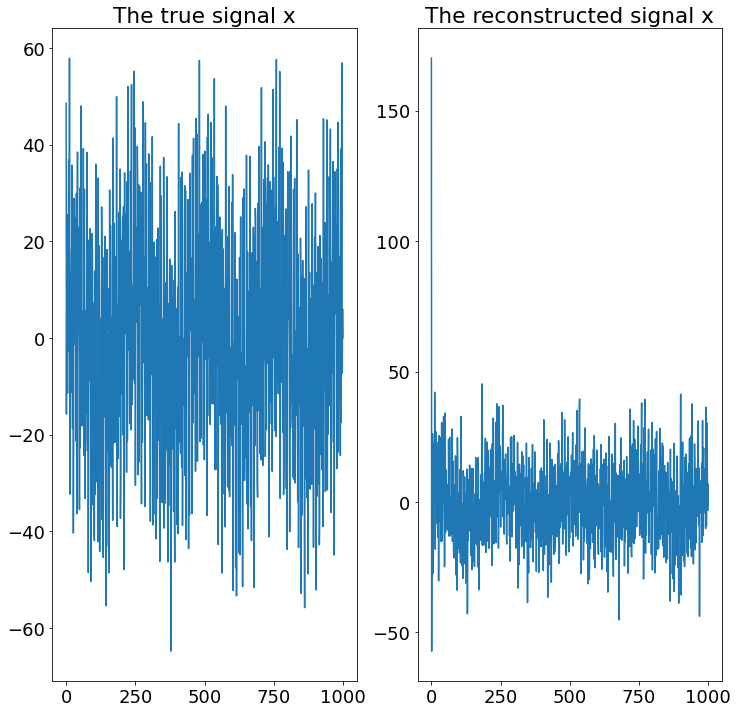

In [6]:
## Solve compressed sensing problem
 
Theta = C @ Psi      # Measure rows of Psi

s_hat = cosamp(Theta,y,p) # CS via matching pursuit
xrecon = idct(s_hat) # reconstruct full signal

fig,axs = plt.subplots(1,2)
axs = axs.reshape(-1)

axs[0].plot(x)
axs[0].set_title('The true signal x')

axs[1].plot(xrecon)
axs[1].set_title('The reconstructed signal x')

plt.show

In [7]:
np.linalg.norm(s - s_hat) / np.linalg.norm(s)

0.6255761900097757

## (a) For each $p$ from $1$ to $100$, using compressed sensing to estimate $\hat{s}$. For each p, repeat this with at least $10$ relizations of random measurment matrix $C$.  Plot the average relative error versus $p$.

<function matplotlib.pyplot.show(close=None, block=None)>

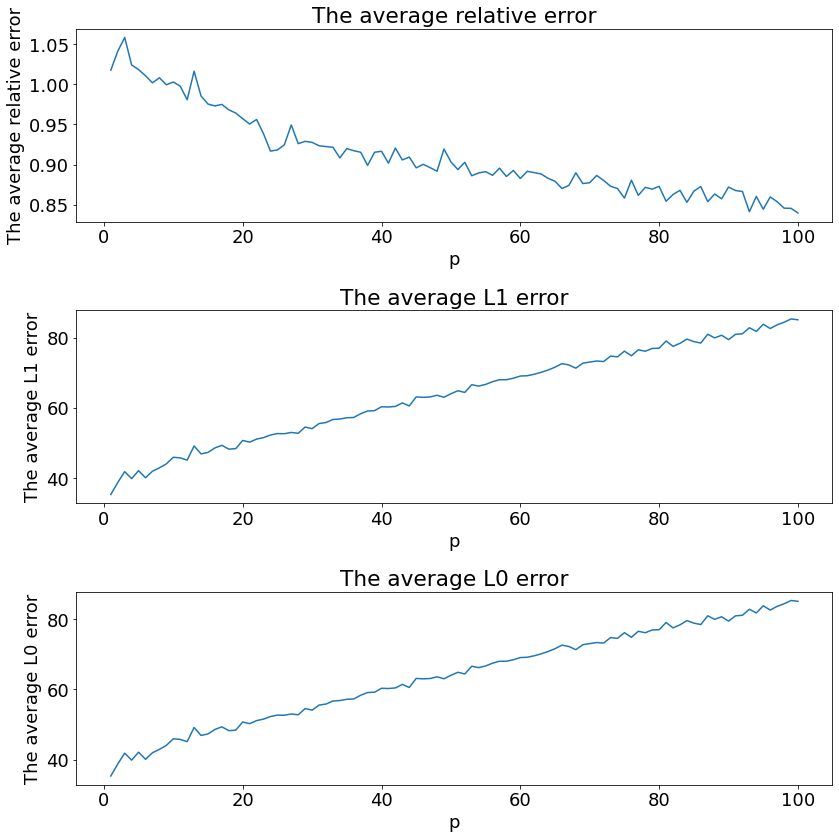

In [8]:
def L1_norm(x):
    return np.linalg.norm(x,ord=1)

def L0_norm(x):
    return np.linalg.norm(x,ord=0)

P=np.arange(1,101)
Error_AR = []
Error_L1 = []
Error_L0 = []
for p in P:
    error_ar=[]
    error_l1=[]
    error_l0=[]
    for i in range(10):
        C1 = np.random.randn(p,n)
        y1= C1 @ Psi @ s # a measurement vector y
        Theta1 = C1 @ Psi      # Measure rows of Psi

        s_hat1 = cosamp(Theta1,y1,p) # CS via matching pursuit
        err = np.linalg.norm(s - s_hat1) / np.linalg.norm(s)
        errl1 = L1_norm(s - s_hat1)
        errl0 = L0_norm(s - s_hat1)
        error_ar.append(err)
        error_l1.append(errl1)
        error_l0.append(errl0)
        
    Error_ar=np.mean(error_ar)
    Error_l1=np.mean(error_l1)
    Error_l0=np.mean(error_l0)
    
    Error_AR.append(Error_ar)
    Error_L1.append(Error_l1)
    Error_L0.append(Error_l0)
    
fig,axs = plt.subplots(3,1)
axs = axs.reshape(-1)

axs[0].plot(P,Error_AR)
axs[0].set_xlabel('p')
axs[0].set_ylabel('The average relative error')
axs[0].set_title('The average relative error')

axs[1].plot(P,Error_L1)
axs[1].set_xlabel('p')
axs[1].set_ylabel('The average L1 error')
axs[1].set_title('The average L1 error')

axs[2].plot(P,Error_L1)
axs[2].set_xlabel('p')
axs[2].set_ylabel('The average L0 error')
axs[2].set_title('The average L0 error')
plt.tight_layout()
plt.show

    

### <span style='color:Purple'> Conclusion:The average relative error decreases as the measurements $p$ increases.  </span>

## (b) Repeat the above experiments for $K=1$ through $K=20$, what changes?

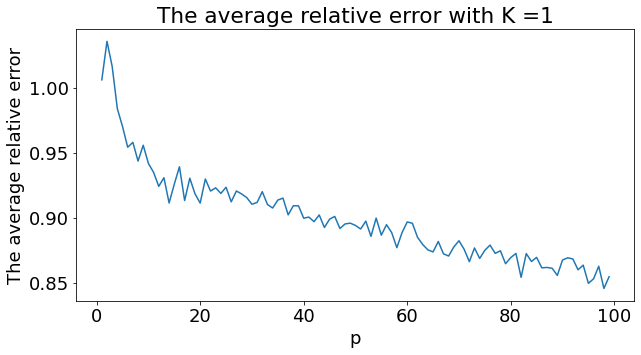

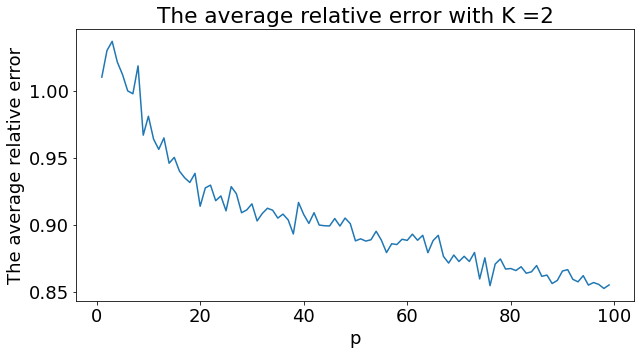

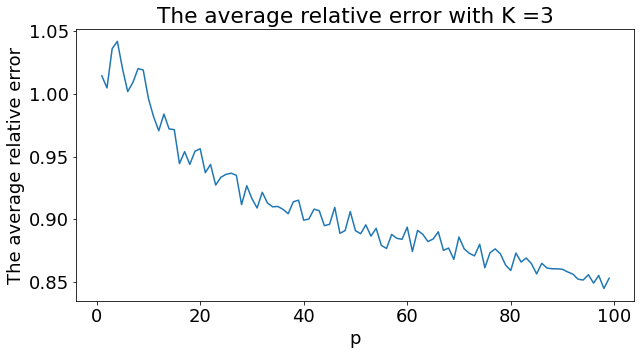

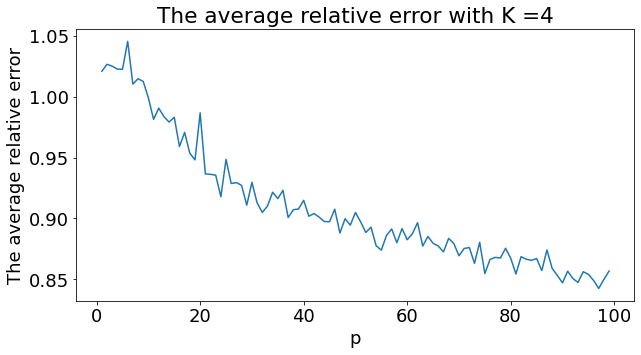

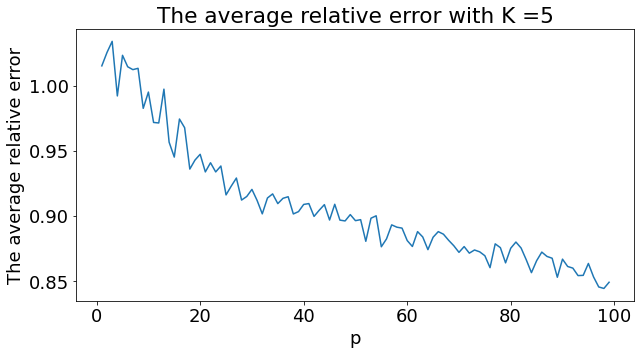

...

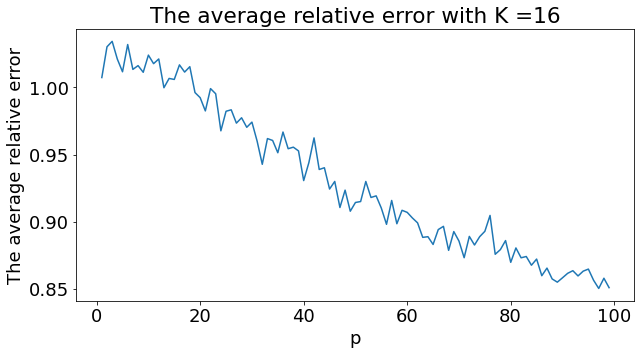

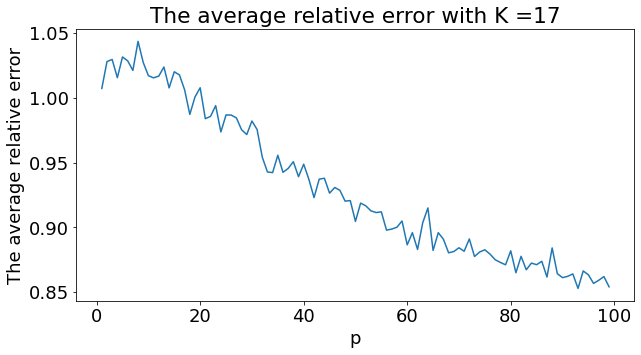

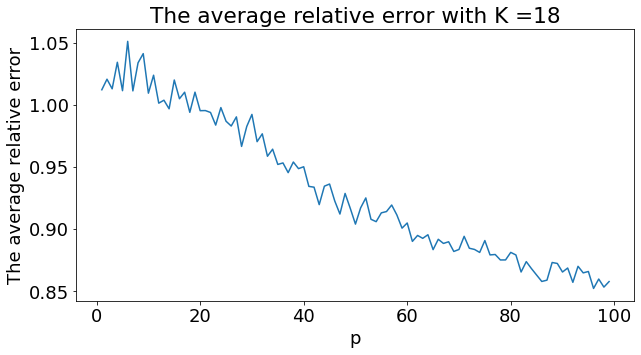

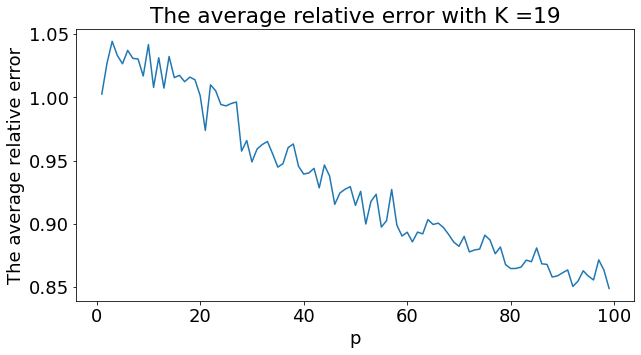

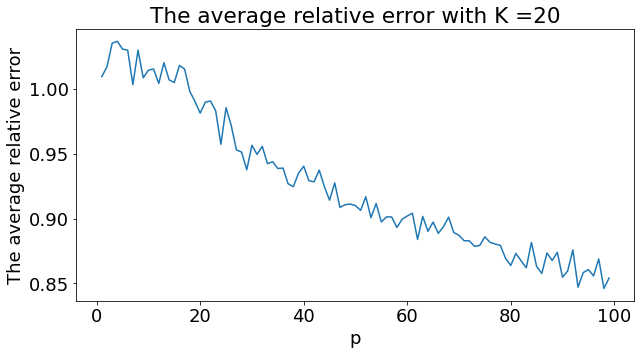

In [9]:
for k in range(1,21): 

    # Create a K-sparse vector s2
    K=k
    s2 = np.zeros(n)
    indexs= np.floor(np.random.rand(K) * n).astype(int)
    values= np.floor(np.random.rand(K) * 10).astype(int)
    s2[indexs]= values


    P2=np.arange(1,100)
    Error_AR2 = []
    for p in P2:
        error_ar2=[]
        for i in range(10):
            C2 = np.random.randn(p,n)
            y2= C2 @ Psi @ s2 # a measurement vector y
            Theta2 = C2 @ Psi      # Measure rows of Psi

            s_hat2 = cosamp(Theta2,y2,p) # CS via matching pursuit
            err2 = np.linalg.norm(s2 - s_hat2) / np.linalg.norm(s2)
            error_ar2.append(err2)

        Error_ar2=np.mean(error_ar2)
        Error_AR2.append(Error_ar2)

    
    fig,axs = plt.subplots(figsize=(10,5))

    axs.plot(P2,Error_AR2)
    axs.set_xlabel('p')
    axs.set_ylabel('The average relative error')
    axs.set_title('The average relative error with K ='+ str(k))
    plt.show

    


### <span style='color:Purple'>Since the number of measurements $p$ from $1$ to $100$ here is far less than the condition of compressed sensing, the comparison of results of different measurements is not very obvious. Next, we continue to increase the number of measurements to meet the compressed sensing conditions, and the comparison of the results of different measurement times will be obvious.</span>

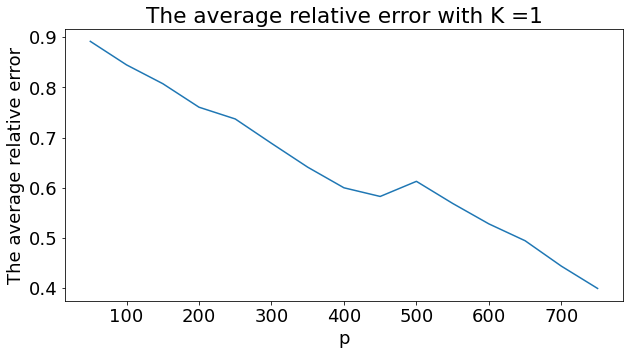

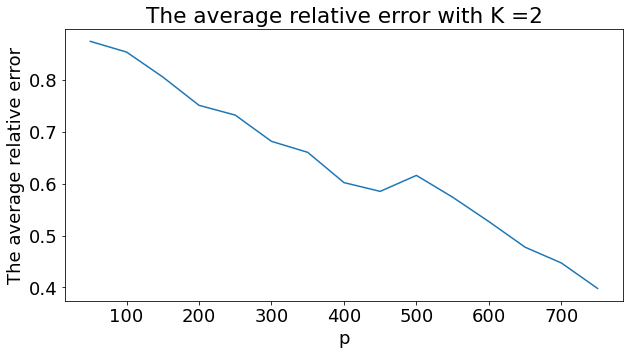

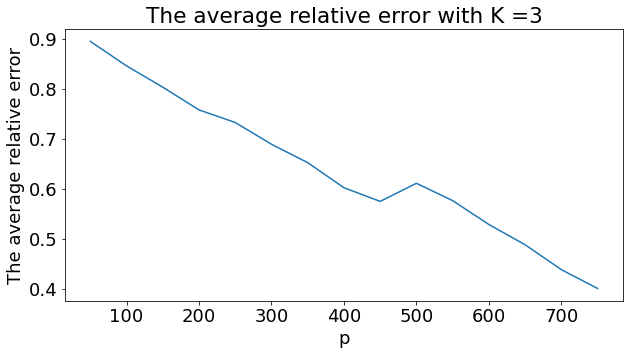

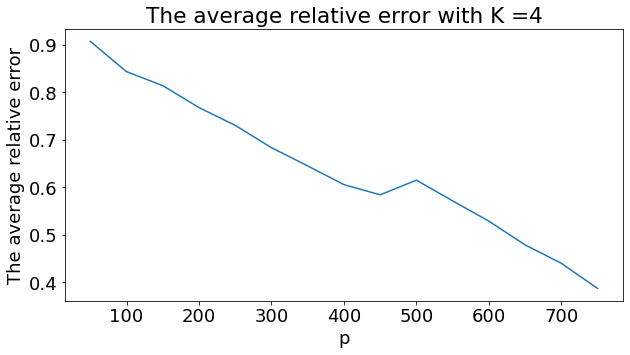

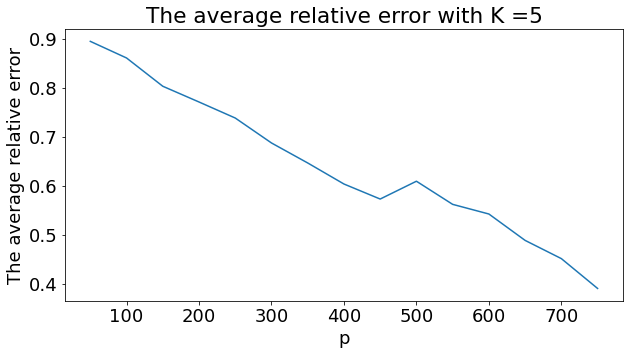

...

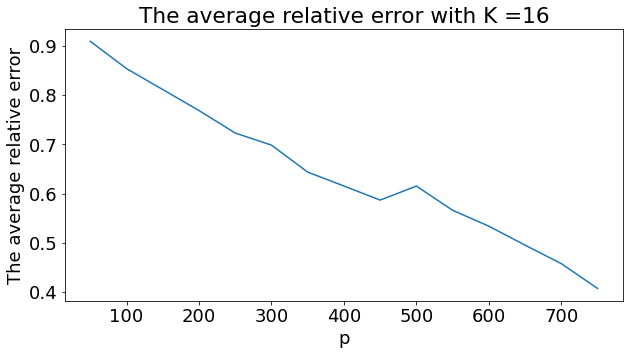

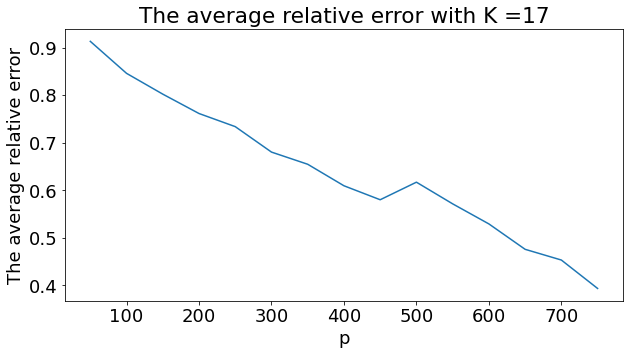

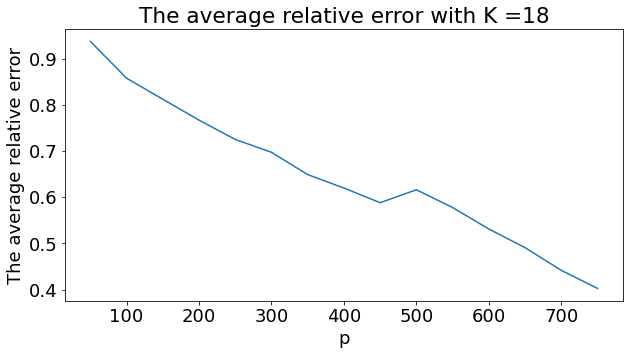

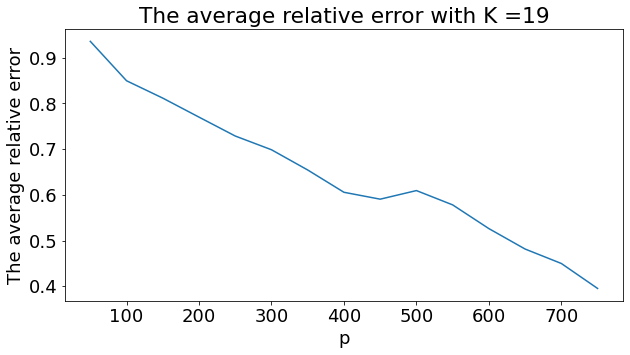

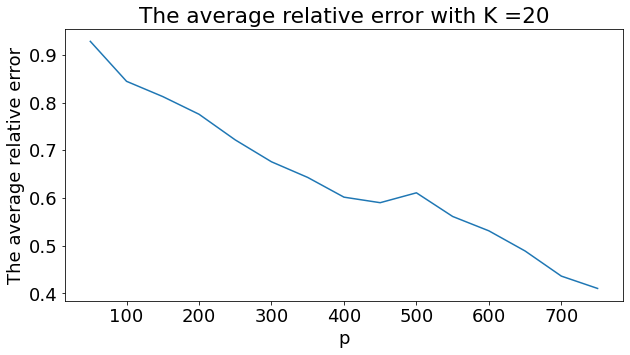

In [11]:
for k in range(1,21): 

    # Create a K-sparse vector s2
    K=k
    s2 = np.zeros(n)
    indexs= np.floor(np.random.rand(K) * n).astype(int)
    values= np.floor(np.random.rand(K) * 10).astype(int)
    s2[indexs]= values


    Error_AR2 = []
    for p in range (50,800,50):
        error_ar2=[]
        for i in range(10):
            C2 = np.random.randn(p,n)
            y2= C2 @ Psi @ s2 # a measurement vector y
            Theta2 = C2 @ Psi      # Measure rows of Psi

            s_hat2 = cosamp(Theta2,y2,p) # CS via matching pursuit
            err2 = np.linalg.norm(s2 - s_hat2) / np.linalg.norm(s2)
            error_ar2.append(err2)

        Error_ar2=np.mean(error_ar2)
        Error_AR2.append(Error_ar2)

    
    fig,axs = plt.subplots(figsize=(10,5))

    axs.plot(np.arange(50,800,50),Error_AR2)
    axs.set_xlabel('p')
    axs.set_ylabel('The average relative error')
    axs.set_title('The average relative error with K ='+ str(k))
    plt.show

### <span style='color:Purple'> Conclusion:As the sparsity $K$ increases, the average relative error for the same number of measurements should become smaller. But the above results still are not obvious. </span>

## (c) Now repeat the above experiment for $K=5$, varying the signal size using $n=100$, $n=500$, $n=1000$, $n=2000$, $n=5000$.

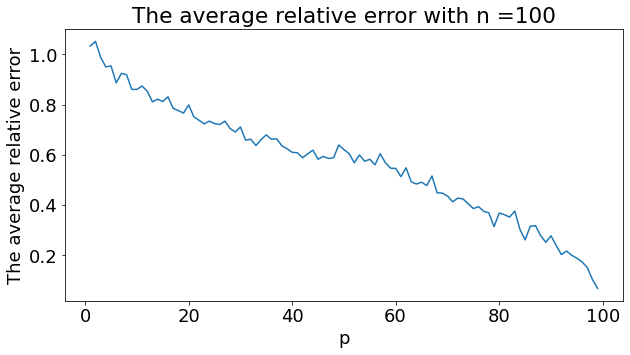

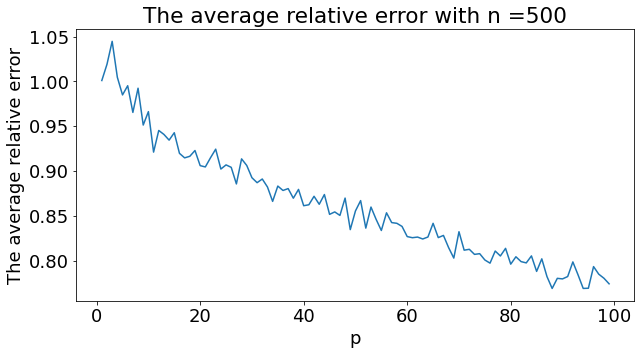

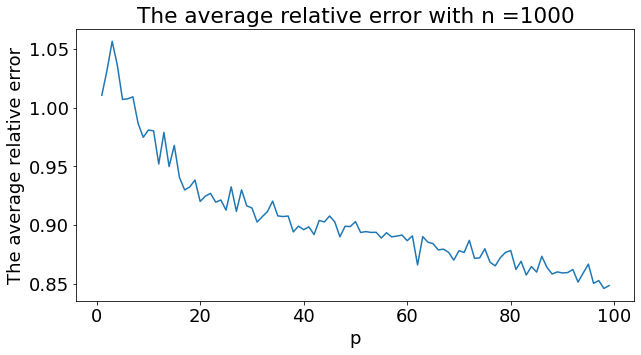

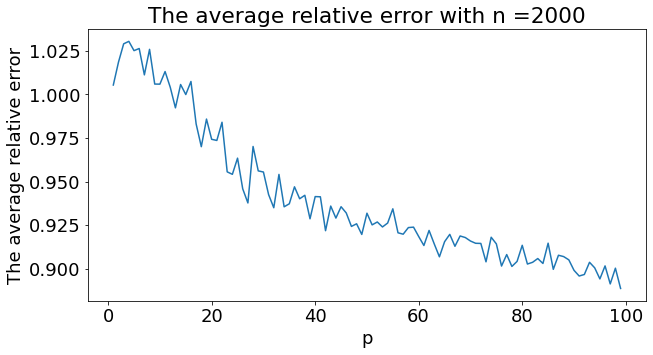

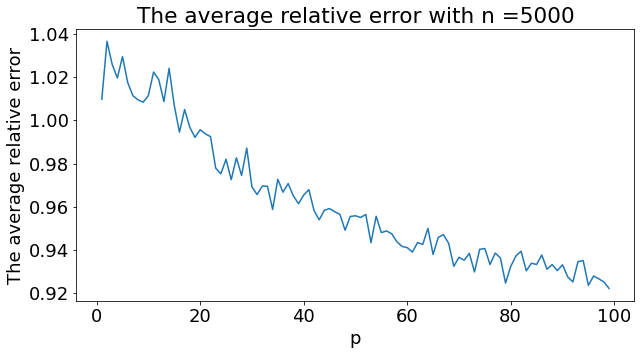

In [10]:

N=[100, 500, 1000, 2000, 5000]

for n3 in N:
    
    # Build Psi
    Psi3 = dct(np.identity(n3))
    
    # Create a 5-sparse vector s3
    s3 = np.zeros(n3)
    indexs= np.floor(np.random.rand(5) * n3).astype(int)
    values= np.floor(np.random.rand(5) * 10).astype(int)
    s3[indexs]= values
    
    P3=np.arange(1,100)
    Error_AR3 = []
    for p3 in P3:
        error_ar3=[]
        for i in range(10):
            C3 = np.random.randn(p3,n3)
            y3= C3 @ Psi3 @ s3 # a measurement vector y
            Theta3 = C3 @ Psi3      # Measure rows of Psi

            s_hat3 = cosamp(Theta3,y3,p3) # CS via matching pursuit
            err3 = np.linalg.norm(s3 - s_hat3) / np.linalg.norm(s3)
            error_ar3.append(err3)

        Error_ar3=np.mean(error_ar3)
        Error_AR3.append(Error_ar3)

    fig,axs = plt.subplots(figsize=(10,5))
    axs.plot(P3,Error_AR3)
    axs.set_xlabel('p')
    axs.set_ylabel('The average relative error')
    axs.set_title('The average relative error with n ='+ str(n3))
    plt.show

    


### <span style='color:Purple'> Conclusion: As the signal size $n$ increases, the average relative error for the same number of measurements becomes larger.  </span>


# <span style='background :yellow' > **Exercise 3.6** </span>

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import scipy.io
import scipy.misc
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams.update({'font.size': 18})

mat_contents = scipy.io.loadmat(os.path.join('VORTALL'))
X=mat_contents['VORTALL']

In [2]:
import imageio

def plotFlow(X):    
    ## Plot Mode 2
    vortmin = -5
    vortmax = 5
    V2 = np.copy(np.real(np.reshape(X,(449,199))))
    V2 = V2.T

    # normalize values... not symmetric
    minval = np.min(V2)
    maxval = np.max(V2)

    if np.abs(minval) < 5 and np.abs(maxval) < 5:
        if np.abs(minval) > np.abs(maxval):
            vortmax = maxval
            vortmin = -maxval
        else:
            vortmin = minval
            vortmax = -minval

    V2[V2 > vortmax] = vortmax
    V2[V2 < vortmin] = vortmin

    plt.imshow(V2,cmap='jet',vmin=vortmin,vmax=vortmax)

    cvals = np.array([-4,-2,-1,-0.5,-0.25,-0.155])
    plt.contour(V2,cvals*vortmax/5,colors='k',linestyles='dashed',linewidths=1)
    plt.contour(V2,np.flip(-cvals)*vortmax/5,colors='k',linestyles='solid',linewidths=0.4)

    plt.scatter(49,99,5000,color='k') # draw cylinder


def createMovie(X):
    plt.rcParams['figure.figsize'] = [8, 8]
    filenames = []
    for i in range(150):
        plotFlow(X[:,i])
        filename = './pics/full'+str(i)+'.png'
        filenames.append(filename)
        plt.savefig(filename)
        plt.close()
    with imageio.get_writer('vortices.gif', mode='I') as writer:
        for filename in filenames:
            image = imageio.imread(filename)
            writer.append_data(image)
    for filename in set(filenames):
        os.remove(filename)

In [3]:
## Plot the original movie of the flow field
createMovie(X)

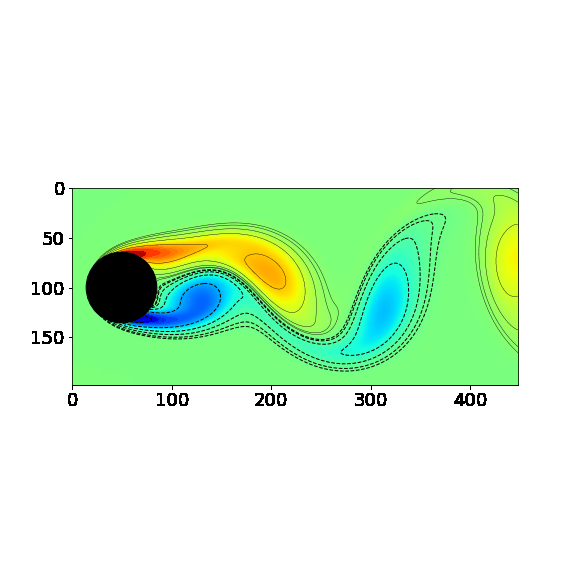

In [4]:
X1=np.copy(np.real(np.reshape(X[:,0],(449,199))))
size = (np.array(X1.shape) * (1/20)).astype(int)
s=size[0]*size[1]
size

array([22,  9])

In [5]:
## Downsample Images (Build Theta)
from skimage.transform import resize

M = X.shape[1]

Theta = np.zeros((s,M))
for k in range(M):
    temp = np.copy(np.real(np.reshape(X[:,k],(449,199))))
    tempSmall = resize(temp, size, anti_aliasing=True) # Make figure size from (449,199) to (22,9)
    Theta[:,k] = np.reshape(tempSmall,s)

Theta.shape

(198, 151)

In [7]:
def plotFlow_Small(X):    
    ## Plot Mode 2
    vortmin = -5
    vortmax = 5
    V2 = np.copy(np.real(np.reshape(X,(22,9))))
    V2 = V2.T

    # normalize values... not symmetric
    minval = np.min(V2)
    maxval = np.max(V2)

    if np.abs(minval) < 5 and np.abs(maxval) < 5:
        if np.abs(minval) > np.abs(maxval):
            vortmax = maxval
            vortmin = -maxval
        else:
            vortmin = minval
            vortmax = -minval

    V2[V2 > vortmax] = vortmax
    V2[V2 < vortmin] = vortmin
    
    #plt.figure(figsize=(22, 9))
    plt.imshow(V2,cmap='jet',vmin=vortmin,vmax=vortmax)

    cvals = np.array([-4,-2,-1,-0.5,-0.25,-0.155])
    plt.contour(V2,cvals*vortmax/5,colors='k',linestyles='dashed',linewidths=1)
    plt.contour(V2,np.flip(-cvals)*vortmax/5,colors='k',linestyles='solid',linewidths=0.4)

    plt.scatter(2,4,5000,color='k') # draw cylinder


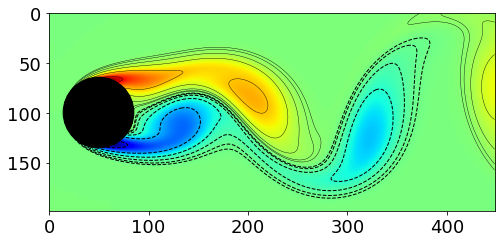

In [8]:
# Plot Mode 2 of the original flow field
plotFlow(X[:,1])

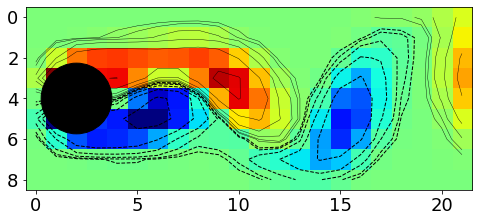

In [9]:
# Plot Mode 2 of the flow field in these new coordinates
plotFlow_Small(Theta[:,1]) 

In [10]:
## Plot a movie of the flow field in these new coordinates 

def createMovie_Small(X):
    plt.rcParams['figure.figsize'] = [8, 8]
    filenames = []
    for i in range(151):
        plotFlow_Small(X[:,i])
        filename = './pics/full'+str(i)+'.png'
        filenames.append(filename)
        plt.savefig(filename)
        plt.close()
    with imageio.get_writer('vortices_small.gif', mode='I') as writer:
        for filename in filenames:
            image = imageio.imread(filename)
            writer.append_data(image)
    for filename in set(filenames):
        os.remove(filename)
        
createMovie_Small(Theta)

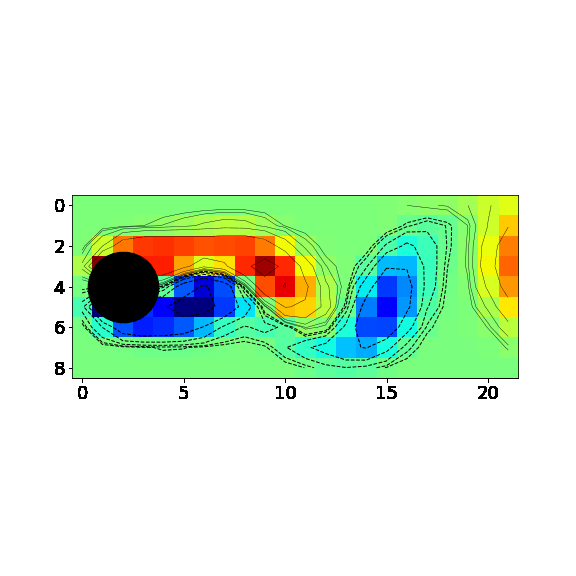

In [11]:
## Renormalize Columns of Theta
normTheta = np.zeros(M)
for k in range(M):
    normTheta[k] = np.linalg.norm(Theta[:,k])
    Theta[:,k] = Theta[:,k]/normTheta[k]


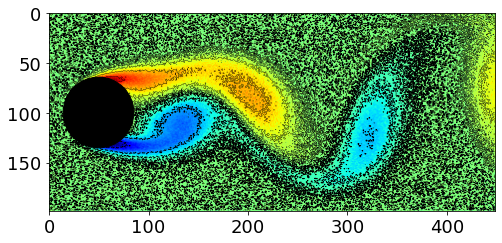

In [24]:
## Pick a column of the full flow field matrix and add Gaussian random noise to this field.
x1 = np.copy(X[:,1])
y = np.copy(x1) + 0.18*np.random.randn(*x1.shape) # Random noise
plotFlow(y)

In [25]:
## Downsample noisy field by a factor of 20
size1= (np.array(X1.shape) * (1/20)).astype(int)
temp1 = np.reshape(np.copy(y),(449,199))
tempSmall1 = resize(temp1, size1, anti_aliasing=True)
y1 = np.reshape(tempSmall1, s)

In [26]:
## L1 Search, Noise

from scipy.optimize import minimize
y2 = np.copy(y1)
eps = 10

# L1 Minimum norm solution s_L1
def L1_norm(x):
    return np.linalg.norm(x,ord=1)

constr = ({'type': 'ineq', 'fun': lambda x:  eps - np.linalg.norm(Theta @ x - y2,2)})
x0 = np.linalg.pinv(Theta) @ y2 # initialize with L2 solution
res = minimize(L1_norm, x0, method='SLSQP',constraints=constr)
s4 = res.x

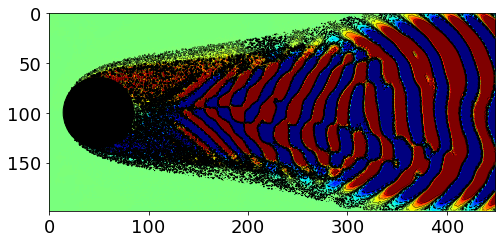

In [27]:
## SRC denoising
plotFlow(X @ (s4/normTheta))

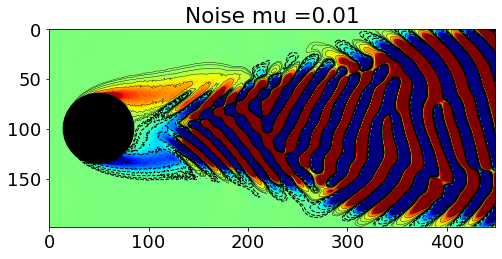

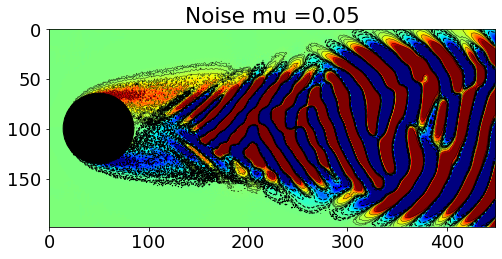

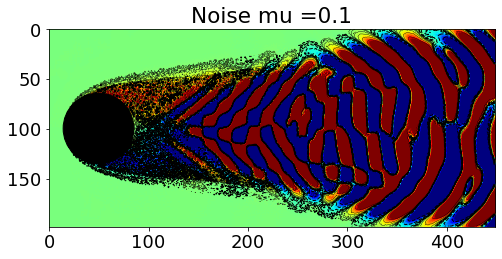

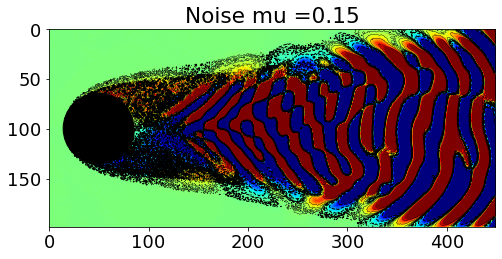

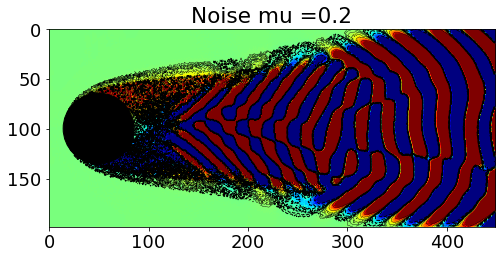

...

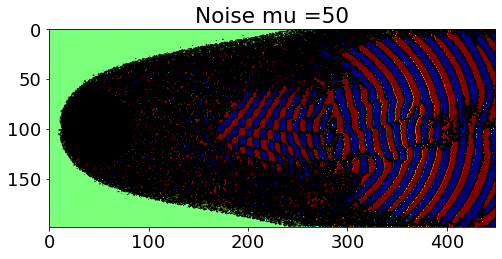

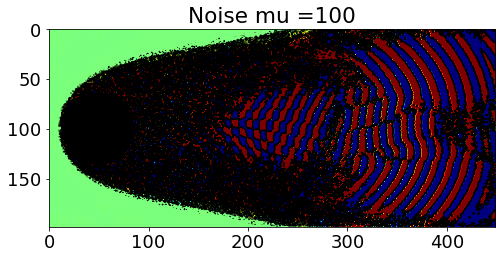

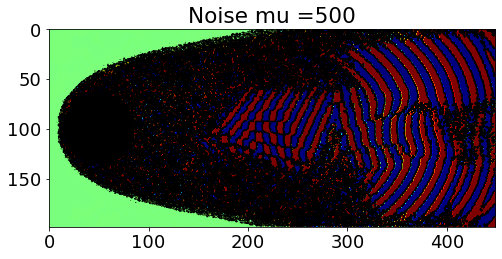

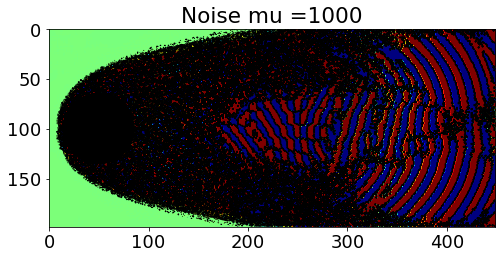

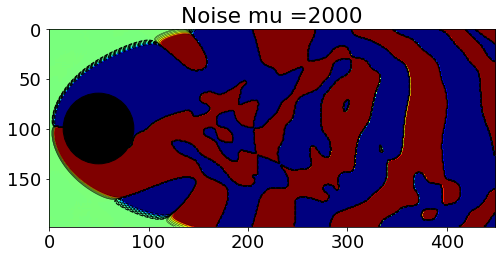

In [29]:
## Determine how much noise is required before the method breaks
Mu=[0.01, 0.05, 0.1,0.15, 0.2,0.5,1,1.5,5,10,50,100,500,1000,2000]
for mu in Mu :
    x1 = np.copy(X[:,1])
    z = np.copy(x1) + mu*np.random.randn(*x1.shape) # Random noise

    # Downsample noisy field by a factor of 20
    size2= (np.array(X1.shape) * (1/20)).astype(int)
    temp2 = np.reshape(np.copy(z),(449,199))
    tempSmall2 = resize(temp2, size2, anti_aliasing=True)
    z1 = np.reshape(tempSmall2, s)

    # L1 Search, Noise
    z2 = np.copy(z1)
    eps = 10

    constr = ({'type': 'ineq', 'fun': lambda x:  eps - np.linalg.norm(Theta @ x - z2,2)})
    w0 = np.linalg.pinv(Theta) @ z2 # initialize with L2 solution
    res = minimize(L1_norm, w0, method='SLSQP',constraints=constr)
    s5 = res.x

    # SRC denoising
    plt.figure()
    plotFlow(X @ (s5/normTheta))
    plt.title('Noise mu =' + str(mu) )